<a href="https://colab.research.google.com/github/Miekevi/brainimaging_VU/blob/main/Project_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Updating the homunculus - towards a more differentiated view of cortical motor maps



## Abstract

The aim of this research was to map out the hand, leg, and face regions of the motor cortex of a single subject which mimicked movements presented by an avatar. The obtained fMRI data was averaged across five runs and statistical analyses were performed by means of a General Linear Model. T-statistics were calculated and results were plotted on flatmaps using a multi-modal parcellation atlas from the Human Connectome Project. 

  The analysis of the data confirmed previous findings insofar that we could not only detect activations in M1 but also areas responsive to movement in the parietal and frontal cortex. 

  Furthermore, regarding the hands, legs and face we were able to display a somatotopic order within the motor cortex which is similar to the arrangement of body parts in the homunculus. However facial movements evoked cortical responses in two separate areas of M1. For the digits no clear-cut within limb somatotopy was detected. 

  In addition a marked somatosensory cortical response could be noted which is in accordance with previous research work and illustrates the inseparability of somato-motor responses and processing. 
  
  Considering the extent of the cortical motor responsive areas we come to the conclusion that the motor system plays a fundamental role not only for movement but also in higher-order cognitive processes.

## Introduction

Even though it is assumed that motor maps represent a vital aspect of organization of the brain, there is still a lack of knowledge regarding their precise outline, especially when it comes to within-limb somatotopy.

 Traditionally these maps have often been depicted as a homunculus - a schematic, disproportional drawing of body parts on the cortical surface reflecting different amounts of peripheral neuronal innervation (e.g. comparatively larger hand and lips representation in primary somatosensory cortex) (Lemon, 2008; Harrison and Murphy, 2014; Saadon-Grosman et al., 2020). 
Although studies argue in favor of an inter-limb somatotopic organization in contralateral M1, the existence of a clear-cut within-limb somatotopy (e.g. digits of the hand) has been controversial. Still recently within-limb somatotopic maps with a high level of spatial precision could be obtained (Marquis et al., 2017; Schellekens et al., 2018; Huber et al., 2020). 

Furthermore, research on sensory maps has shown that representations of the somatosensory system exist all across the cortex and that the proportion of body parts within these maps (and thus the appearance of the homunculus) differs between neuroanatomical regions.  This outcome has been related to different functional specializations of these cortical areas (cf. Saadon-Grosman et al., 2020). It is to be expected that findings might be similar for motor cortical areas.

With this project we aim at replicating and expanding results from previous research by depicting the somatotopic maps which pertain to the moved body parts (hands, digits, feet, and face) in the experiment. A better understanding of cortical regions responsive to movements will ultimately contribute to a deeper comprehension of the complex interdependencies of M1 and other cortical areas and might be beneficial for patients suffering from cortical alterations as well as to characterize cortical reorganization after brain injury (Marquis et al., 2017).



## Methods 

The data analyzed in this experiment was gathered from a single subject who performed different motor tasks in a 7 Tesla fMRI. The tasks were predetermined by a movie showing an avatar moving its facial muscles, hands and legs in a quasi-cyclic order that was unchanged across runs. More precisely, the eyebrows, eyes, mouth, tongue, all digits of the left and right hand and both feet were moved. Cycles could differ in terms of performance of unilateral or bilateral movements of the upper or lower limbs. The experiment thus blended elements of a block and event-related design.

BOLD-fMRI images were acquired of the whole brain employing echo-planar-imaging [repetition time (TR)/echo time (TE)= 1.6/0.022 s, flip angle=65]. 

A block of approx. 2.25 seconds of movement was followed by a rest interval of 1 second. The onset of the first movement was at 11.988 seconds. The duration of the whole experiment was 212 seconds (71 timepoints). The gathered data was averaged across five runs and provided very high-signals. We refrained from further preprocessing of the data as this had already been done to a large extent. For example the temporal signal had been high-pass filtered as there were no more slow drifts in the time courses of all voxels. However,  few spikes were visible in the data (see plot 1).  

![](https://drive.google.com/uc?export=view&id=1Zm-LsO_liqTdzaN9ycDOPcBL0bms-ukD)
*Plot 1 checking for drift*

Furthermore the signal had been converted to percent signal change. No strong spatial smoothing was applied so that gradients could be visualized in more detail. Statistical analysis was performed by means of a General Linear Model. 

Each predictor was convolved with a HRF. Using pycortex statistical results were plotted on a flatmap applying a multi-modal parcellation derived from an atlas of the Human Connectome Project. The latter has been created taking into account anatomical, functional and histological information (see Glasser et al., 2016).

**T-statistic of the contrast of left vs. right hand, foot and fingers**

In order to plot the results on flatmaps we first created a function to calculate the t-statistic of the contrasts of "left hand" vs. "right hand" as well as “left foot'' vs. “right foot”. The base code from the backbone_projects notebook was re-used. As mandated, the t-statistic threshold was set to 4 for all of the t-tests of the assignment. We decided to use the same threshold for all results in order to compare the flatmaps to each other more easily.

To calculate the contrast between the left and right hands, all fingers were included in the t-test. Per voxel a negative t-statistic indicated the left hand and a positive t-statistic indicated the right hand. A flatmap was created based on the value of the t-statistic and the location of the voxel. 

The same calculations were made for the feet, only in this case the unique event types of the left leg and right leg were used for the t-statistic. 

To test the left vs. right contrast for each finger the same methods were used. All five fingers were compared to the duplicate on the other hand. The t-statistics were calculated separately, starting with the thumb to the pinky. 

**T-statistic of the contrast of the face vs. an implicit baseline**

To create a flatmap displaying facial activation against an implicit baseline we wrote a function to calculate the t-statistic of all facial features including the eyebrows, eyes, mouth and tongue. We combined these features into a single (face) feature which was then contrasted against an implicit baseline of zero activation.

**Gradient representation of the fingers and face**

To create a somatotopic gradient on the surface we combined the separate flatmaps and ordered them based on the winning fingers and winning facial features with the highest t-statistic. A function was created to generate a list with the winning feature for each voxel. A feature would be considered ‘winning’ if it had the highest absolute t-statistic on a voxel.  If the t-statistic on a voxel was either 0 for all features or ‘NaN’, it was not included in the flatmap. This creates two flatmaps showing the gradient of the winning fingers and the gradient of winning facial features.

As a winning feature with a t-statistic of 0.001 or even less would still show on the flatmap we did include an extra threshold. This threshold made sure that only the voxels that had a t-value of minimally 4 would be represented on the flatmaps. The flatmap of the fingers ranged from -5 to 5 , with 0 being a neutral value in the flatmap. The finger-line follows the order: left pinky to thumb and right thumb to pinky.  The flatmaps of the face ranged from 0 to 4, with 0 again being neutral. The facial-line follows the order: eyebrows, eyes, mouth and tongue.







## Results

**1. Contrast between left vs. right hand and left vs. right foot**

![](https://drive.google.com/uc?export=view&id=1eLF7BgT49dxHTPPkGh5dnSfHU_6uRtKZ)
*Figure 1 Contrast between left and right hand*

The flatmap for the representation of the hands showed several interesting aspects. The contralaterality of the cortical representations of the hands is clearly distinct as strong activations for the right hand in the left motor and somatosensory cortex (S1-S4 in the flatmap) and vice versa could be observed. In general the somato-motor cortical response for the left hand was stronger than the response for the right hand. Furthermore the motor tasks induced concomitant activation of the somatosensory cortex. Additionally strong activations in the visual cortex (V1-V3) of both hemispheres could be found as well as some responses in the premotor cortex, the supplementary motor area and in parietal areas. 

![](https://drive.google.com/uc?export=view&id=1lDrZxREf02M-wQCprDiyCvZ0YbrQbNJk)    
*Figure 2 Contrast between left and right foot*

In comparison with the hands, the flatmap representing the T-statistic of the contrast of "right foot" vs. "left foot" showed lower cross cortical activation with fewer signals in somatosensory, motor, and visual cortex as well as outside the marked areas on the flatmap. In accordance with the representation of the homunculus in our experiment the cortical areas for the feet can be found medial to the hands; towards the midline of the brain in the longitudinal fissure. Furthermore some ipsilateral activation in the cortical regions representing the hands was detected. 

**2. Contrast of the face vs. an implicit baseline**

The flatmap representing the T-statistic of the face showed cortical activations within S1, M1, the medial areas as well as in frontal, parietal, temporal and visual cortex with roughly similar patterns for both hemispheres. Interestingly the same areas exhibited pronounced negative activations, mainly in cortical regions that were identified to be responsive to hand and face movements. Remarkably a second activated somato-motor area could be seen, which was situated between the cortical portions previously described as belonging to the hands and feet.

![](https://drive.google.com/uc?export=view&id=1vfstam4VS90vBceay4VEneI1ZaNb8mnA)
*Figure 3 Contrast of the face vs. an implicit baseline*

In summary the flatmaps we obtained so far display a somatotopic order in the primary motor and somatosensory cortex and are mostly similar to the depictions in the homunculus, which is characterized by a lateral to medial arrangement of the face, hands and legs. However, repetitive patterns for the face could be detected. 

The map is not contiguous on the surface as not all body parts have been moved in the experiment and could thus not be included as regressors in our design (e.g. the trunk).

**3. Contrast between left vs. right fingers**

The flatmaps representing the T-statistic of the contrast of the different fingers of the right and left hand are not depicted here (see code section). 

In summary, contralateral cortical responses to finger movements were dependent on the particular finger and not similar in both hemispheres. We saw stronger contralateral activations in the motor and somatosensory cortex for the left thumb (in this case also ipsilateral responses), middle finger and pinky than for their right counterparts. Activations for the left ring finger were slightly stronger in the contralateral motorcortex. However, the right pointer finger evoked stronger contralateral responses than the left one, yet mostly in the somatosensory cortex. 
The digits of the motor homunculus are usually a little larger than in the somatosensory one (Trepel, 2008). We were not able to detect this pattern in our flatmaps as representations were quite balanced in these areas. Outside of the motor and somatosensory cortex activations were rather small.

**4. Gradient representation of the fingers**
![](https://drive.google.com/uc?export=view&id=1NTzBiYjUblSS1RvVVFeQ6xYmr3gBEf3l)
*Figure 4 Gradient representation of the fingers*

We could detect strong contralateral somato-motor responses for the pinkies (especially the left one) and less pronounced activations for the thumbs. 
The left pointer-, middle- and ring finger evoked some contralateral responses.
Ipsilateral somato-motor activity was seen for the left pinky. Again, responses in the motor cortex were not larger as compared to the somatosensory cortex. Furthermore a clear-cut somatotopic arrangement could not be found, as responses overlapped to some degree. 
    

**5. Gradient representation of the face**
![](https://drive.google.com/uc?export=view&id=1bZ0qKvIF9oJ0hGacbvnVsoAmam0BIvLL)
*Figure 5 Gradient representation of the face*

Our flatmaps for the gradient representation of the face show partial overlap but also deviate from classical representations of the somato-motor homunculus in M1 and S1.

For example we also found a major representation of the tongue, especially in S1 but this activation is not, as expected, localized in the most anterior and lateral portions of M1/S1. In this area we could see an activation pertaining to the eyebrows and eyes (especially with a slightly higher threshold not depicted here) , followed by a major representation of the tongue (especially in S1) and some activations in the motor cortex for the mouth. Moving slightly posterior and medial, again responses for the eyebrows and eyes can be witnessed. In the most medial parts of the motor cortex some prominent tongue representations can be seen. In general the tongue seemed to show prominent activations in the medial wall. 

In summary a repetitive pattern of the examined facial body parts could be detected. In addition the representations for the facial body parts overlapped to some degree. A further interesting aspect is that there were marked responses to mouth movements in temporal cortical regions. 





## Discussion

**1.Contrast between left vs. right hand and left vs. right foot**

This finding might be due to the fact that the right-handed subject needed more effort to move with the non preferred hand which may cause BOLD responses to differ (Jäncke et al., 1998).
Furthermore the motor tasks induced concomitant activation of the somatosensory cortex. This phenomenon has been explained in several ways, for example by tactile stimulations during movement, proprioceptive processing or connections between somato-motor cortical regions (Marquis et al., 2017). 

As the participant watched a movie of an avatar during the experiment, strong activations in the visual cortex (V1-V3) of both hemispheres could be found. As movie watching is a binocular activity, there is no strong contralateral activation pattern in this case.

In addition some activations in the premotor cortex, in the supplementary motor area as well as in parietal areas could be observed. 

The premotor cortex is involved in the execution of  movements and has been described as active when “motor routines are run in response to visual or somatic sensory cues”. It is usually activated bilaterally and if motor tasks require cognitive operations, representations of body parts seem to be more segregated in this area compared to M1 (Marquis et al., 2017; Mtui et al., 2021). Buccino et al. found that even the observation of movements elicits a somatotopically organized activation of the premotor cortex (Buccino et al., 2001). Furthermore somatosensory maps have shown a pronounced representation of the upper limb in this area (Saadon-Grosmam et al., 2020).The supplementary motor area has been associated with the planning of complex movements (Trepel, 2008), and previous research has identified a between-limb, rostrocaudal, face-to-leg somatotopic representation in humans. At the same time the somatotopy in the SMA is assumed to be composed of more overlapping representations than in M1 (Marquis et al., 2017; Zeharia et al., 2012). 

Also in parietal areas (superior and inferior parietal lobules) a somatotopy has been detected. These regions are thought to be a site of sensorimotor integration in general (for example of retinotopic and somatosensory information) with some small areas being specialized for visually guided grasping and reaching movements (Sereno and Huang, 2014; Marquis et al., 2017; Saadon-Grosmam et al., 2020). 

**Contrast between left and right foot**
An explanation for the diminished signal in the visual cortex might be that finger movements are more salient compared to feet movements. 


In accordance with the representation of the homunculus in our experiment the cortical areas for the feet can be found medial to the hands; towards the midline of the brain in the longitudinal fissure. Similarly research on somatosensory maps has shown that large representations of the lower limbs could be found in medial regions (Saadon-Grosman et al., 2020). 

Furthermore some ipsilateral activation in the cortical regions representing the hands was detected. There are several plausible explanations for this observation. Firstly, as cycles of foot movements generally follow cycles of hand motion, we might witness some kind of remaining activation here. Secondly, these responses could relate to a decrease in cortical activity of unmoved body parts (during movement of other parts of 
the body) which is thought to reflect neural inhibition and movement suppression (“negative BOLD homunculus”; Zeharia et al., 2012). Thirdly,  these responses could relate to ipsilateral representations of foot movements in the previously described hand areas.

**2. Contrast of the face vs. an implicit baseline**

Interestingly the same areas exhibited pronounced negative activations, mainly in cortical regions that were identified to be responsive to hand and face movements. This phenomenon again is likely related to a decrease in activity in these areas pertaining to the unmoved body parts and reflects movement suppression (Zeharia et al., 2012).

Remarkably a second activated somato-motor area could be seen, which was situated between the cortical portions previously described as belonging to the hands and feet.

**3. Contrast between left vs. right fingers**

In summary, contralateral cortical responses to finger movements were dependent on the particular finger and not similar in both hemispheres. We saw stronger contralateral activations in the motor and somatosensory cortex for the left thumb (in this case also ipsilateral responses), middle finger and pinky than for their right counterparts. Activations for the left ring finger were slightly stronger in the contralateral motor cortex. As described for the hands, this might be related to the higher effort which is necessary to move the non preferred digits. The digits of the motor homunculus are usually a little larger than in the somatosensory one (Trepel, 2008). We were not able to detect this pattern in our flatmaps as representations were quite balanced in these areas.

**4. Gradient representation of the fingers**

We could detect strong contralateral somato-motor responses for the pinkies (especially the left one) and less pronounced activations for the thumbs. 

The left pointer-, middle- and ring finger evoked some contralateral responses.

The reason for  the comparatively stronger activations for the left hand have been previously explained. The pinkies might elicit more activation because the effort to restrain movements only to the pinky could be higher than for other digits. Ipsilateral somato-motor activity was seen for the left pinky, which corresponds to previous research showing that during unimanual finger movements of the left hand ipsilateral motor areas were recruited (Verstynen et al., 2004). 

Again, responses in the motor cortex were not larger as compared to the somatosensory cortex. Furthermore a clear somatotopic arrangement could not be found, as responses overlapped to some degree. Our findings are in accordance with previous research regarding within-limb somatotopy (incl. finger somatotopy) insofar as it is usually emphasized that within-limb representations are less clear-cut than between-limb motor somatotopy. Movements of the fingers often lead to a pronounced overlap of activation and neurons within M1 are thought to encode coordinated rather than individual finger movements (Ejaz et al., 2015; Krippl et al., 2015; Marquis et al., 2017). On the other hand the distinction of cortical digit representation has been possible by applying subtractive approaches that contrasted each movement against all other movements using geographic procedures as well as Gaussian population receptive field models (Marquis et al., 2017, Schellekens et al., 2018). 

A sub-millimeter fMRI study has even provided evidence that on a mesoscopic level every digit possesses multiple representations within M1 depending on movement involvement (Huber et al., 2020). Dechent and Frahm conclude that in the hand area of M1 a functional somatotopy can be found that allows for both coordinated common movements and independent individualized movements (Dechent and Frahm, 2003).

**5. Gradient representation of the face**

Our flatmaps for the gradient representation of the face show partial overlap but also deviate from classical representations of the somato-motor homunculus in M1 and S1.
For example we also found a major representation of the tongue, especially in S1 but this activation is not, as expected, localized in the most anterior and lateral portions of M1/S1. In this area we could see an activation pertaining to the eyebrows and eyes, followed by a major representation of the tongue (especially in S1) and some activations in the motor cortex for the mouth. Moving slightly posterior and medial, again responses for the eyebrows and eyes can be witnessed. In the most medial parts of the motor cortex some prominent tongue representations can be seen. In general the tongue seemed to show prominent activations in the medial wall. 

In summary a repetitive pattern of the examined facial body parts could be detected.In addition the representations for the facial body parts overlapped to some degree. A further interesting aspect is that there were marked responses to mouth movements in temporal cortical regions. In the litterature…
Threshold is t statistic of at least 4
0 is no activation 1 is eyebrows, 2 eyes, 3 mouth, 4 tongue

A few aspects are important to mention when it comes to fMRI research of motor maps. As movements inside the scanner are likely to be part of the experimental design, it should be explicitly controlled that participants only move body parts they are supposed to move during particular cycles of the experiment. This can be controlled for example via EMG registration (Zeharia et al., 2012). Furthermore training of participants to reduce unwanted motion as well as preprocessing steps such as distortion and motion correction are thus of particular importance ().
Also it should be taken into account that an almost unchanged and therefore predictable order of movements of different body parts (like in this experiment) might lead to different motor cortical activations than a random sequence of motor tasks would.
Additionally the rest interval between movement circles in our study was rather short which might have caused an overlap of cortical responses for the different body parts.
In accordance with findings from a study investigating somatosensory cortical representations, we observed that the motor maps of the fingers, hands, face and legs extend beyond the narrow borders of M1 to larger fractions of the cortex, including higher-order regions. Zeharia at al. applied a spectral analysis and detected homunculi within the basal ganglia (globus pallidus, putamen). They were even able to predict movements of body parts in these homunculi using MVPA.We therefore draw the conclusion that (sub-)cortical areas responsive to movement are more extended than previously thought and likely play a role in high cognitive processing (Zeharia et al., 2015; Saadon-Grosman, 2020).


## References

* Akselrod, M., Martuzzi, R., Serino, A., van der Zwaag, W., Gassert, R., Blanke, O., 2017. Anatomical and functional properties of the foot and leg representation in areas 3b, 1 and 2 of primary somatosensory cortex in humans: A 7T fMRI study. NeuroImage, Volume 159, 473-487.

* Buccino, G., Binkofski, F., Fink, G.R., Fadiga, L., Fogassi, L., Gallese, V.,  Seitz, R.J.,  Zilles, K., Rizzolatti, G.,  Freund, H.-J., 2008. Action observation activates premotor and parietal areas in a somatotopic manner: an fMRI study. European Journal of Neuroscience, 13(2): 400-404.

* Dechent, P., Frahm, J., 2003. Functional somatotopy of finger representations in human primary motor cortex. Human Brain Mapping, 18(4): 272-283.

* Glasser, M.F., Coalson, T.S., Robinson, E.C., Hacker, C.D. et al., 2016. Multi-modal parcellation of human cerebral cortex. Nature,  536: 171-178.

* Ejaz, N., Hamada, M., Diedrichsen, J., 2015. Hand use predicts the structure of representations in sensorimotor cortex. Nature Neuroscience, 18(7): 1034–1040.

* Harrison, T.C., Murphy, T.H., 2014. Motor maps and the cortical control of movement. Current Opinion in Neurobiology, 24(1):88-94. 

* Huber, L., Finn, E.S., Handwerker, D.A., Bönstrup, M. et al., 2020. Sub-millimeter fMRI reveals multiple topographical digit representations that form action maps in human motor cortex. NeuroImage, Volume 208.

* Jäncke, L., Peters, M., Schlaug, G., Posse, S., Steinmetz, H., Müller-Gärtner, H.-W., 1998. 
Differential magnetic resonance signal change in human sensorimotor cortex to finger movements of different rate of the dominant and subdominant hand.  Cognitive Brain Research, 6(4): 279-284.

* Krippl, M., Karim, A.A., Brechmann, A., 2015. Neuronal correlates of voluntary facial movements. Frontiers in Human Neuroscience, Volume 9:598.

* Lemon, R.N., 2008. An enduring map of the motor cortex. Experimental Physiology, 93: 798-802.

* Marquis, R., Jastrzębowska, M., Draganski, B., 2017. Novel imaging techniques to study the functional organization of the human brain. Clinical and Translational Neuroscience, 1(1): 1-8.

* Mtui, E., Gruener, G., Dockery, P., 2021. Fitzgerald's Clinical neuroanatomy and neuroscience. Cerebral Cortex. Eighth edition, Elsevier Limited: 294-309.

* Saadon-Grosman, N., Loewenstein, Y., Arzy, S., 2020. The creatures of the human cortical somatosensory system. Brain Communications, 2 (1).

* Schellekens, W., Petridou, N., Ramsey, N.F., 2018. Detailed somatotopy in primary motor and somatosensory cortex revealed by Gaussian population receptive fields. NeuroImage, Volume 179, 337-347.

* Sereno, M.I., Huang, R.S, 2014. Multisensory maps in parietal cortex. Current Opinion in  Neurobiology, 24(1):39-46.

* Trepel, M., 2008. Neuroanatomie: Struktur und Funktion. München, Jena: Elsevier GmbH,  Urban und Fischer.

* Verstynen, T., Diedrichsen, J., Albert, N., Aparicio, P., Ivry, R.B., 2005. Ipsilateral Motor Cortex Activity During Unimanual Hand Movements Relates to Task Complexity. Journal of Neurophysiology, 93(3): 1209-1222.

* Zeharia, N., Hertz, U., Flash, T., Amedi, A., 2015. New whole-body sensory-motor gradients revealed using phase-locked analysis and verified using multivoxel pattern analysis and functional connectivity. The Journal of Neuroscience, 35(7):2845-2859.

* Zeharia, N., Hertz, U., Flash, T., Amedi, A., 2012. Negative blood oxygenation level dependent homunculus and somatotopic information in primary motor cortex and supplementary motor area.The Proceedings of the National Academy of Sciences, 109 (45): 18565-18570.

#Installing the data files and libraries

We will first install and download the data files. This is a direct copy of what was written in backbone_projects.ipynb. Note: you don't have to execute this part everytime.

In [ ]:
# this cell installs some dependencies. 
# feel free to disregard the output this generates

!apt -qq install inkscape > /dev/null
!pip -qq install nibabel nilearn
!pip -qq install git+https://github.com/gallantlab/pycortex.git#egg=pycortex



Extracting templates from packages: 100%
     |████████████████████████████████| 10.1 MB 23.3 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done


In [ ]:
# after these basic installs, we can import our required packages. 

import numpy as np
import scipy as sp
import nibabel as nb
import nilearn as nl
from nilearn.surface import load_surf_data
import os, shutil, urllib.request

from matplotlib import rc
rc('animation', html='jshtml')

import matplotlib.pyplot as plt
%matplotlib inline 

In [ ]:
#
# this cell ensures that we can work with our own surface from within the colab environment
#

os.makedirs('/content/pycortex/db', exist_ok=True)
os.makedirs('/content/pycortex/colormaps', exist_ok=True)
os.makedirs('/content/data', exist_ok=True)

wrong_filestore_location = 'build/bdist.linux-x86_64/wheel/pycortex-1.3.0.dev0.data/data/share/pycortex/'
with open('/usr/local/lib/python3.7/dist-packages/cortex/defaults.cfg', 'r') as f:
  file_source = f.read()
replace_string = file_source.replace(wrong_filestore_location, '/content/pycortex/') #save output 
with open('/usr/local/lib/python3.7/dist-packages/cortex/defaults.cfg', 'w') as f:
  f.write(replace_string)   

os.chdir('/tmp/')
!git clone https://github.com/gallantlab/pycortex.git
!cp /tmp/pycortex/filestore/colormaps/* /content/pycortex/colormaps/

#
# and we'll download our average hcp subject for pycortex visualization
#
pycortex_sj_URL = "https://ndownloader.figshare.com/files/25768841"

urllib.request.urlretrieve(pycortex_sj_URL, os.path.join('/content/pycortex/db', 'hcp_999999.zip'))
!unzip -qq /content/pycortex/db/hcp_999999.zip -d /usr/share/pycortex/db/

#
# and then download the projects' data from figshare
#

timeseries_data_URL = 'https://ndownloader.figshare.com/articles/14096209/versions/3'
urllib.request.urlretrieve(timeseries_data_URL, os.path.join('/content/data', '14096209.zip'))
!unzip -qq /content/data/14096209.zip -d /content/data/
!unzip -qq /content/data/hrf_mapper_59k.zip -d /content/data/hrf_mapper_59k/
!unzip -qq /content/data/prf_mapper_59k.zip -d /content/data/prf_mapper_59k/
!unzip -qq /content/data/soma_mapper_59k.zip -d /content/data/soma_mapper_59k/
!unzip -qq /content/data/atlas.zip -d /content/data/

Cloning into 'pycortex'...
remote: Enumerating objects: 23889, done.
remote: Counting objects: 100% (2293/2293), done.
remote: Compressing objects: 100% (785/785), done.
remote: Total 23889 (delta 1533), reused 2151 (delta 1449), pack-reused 21596
Receiving objects: 100% (23889/23889), 476.16 MiB | 21.00 MiB/s, done.
Resolving deltas: 100% (18215/18215), done.


In [ ]:
import cortex as cx

In [ ]:
# Here, I'm using python's awesome f-string functionality to load the data in a structured way across hemisperes. 
# Once the data have been loaded (for plotting and stuff), we don't have to care about hemispheres so much anymore. 
# There are 3 separate versions here, one for each project-dataset.

# We will only use this version

#########################################################################################################
###############
############### somatotopic mapping data
###############
#########################################################################################################

tseries_raw = np.concatenate([load_surf_data(
        os.path.join('/content/data/soma_mapper_59k', f'sub-01_ses-01_task-soma_run-median_space-59k_hemi-{hemi}_sg_psc.dtseries.gii'))
         for hemi in ['L', 'R']])

# and, we'll check the shape of the data to see whether things make sense
# data should be shaped as vertices by timepoints, and each hemisphere is 59k vertices - hence the name :) 
print(tseries_raw.shape)

(118584, 141)


# Raw data and preprocessing

By looking at the maps and plots in this section we determined what preprocessing was done and if we needed to do more. This is almost a direct ocpy of backbone_projects as we decided against preprocessing.


Failed to get connection
** (inkscape:3602): CRITICAL **: 21:00:41.215: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3602): CRITICAL **: 21:00:41.215: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3602): CRITICAL **: 21:00:41.215: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
Failed to get connection
** (inkscape:3605): CRITICAL **: 21:00:42.722: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3605): CRITICAL **: 21:00:42.722: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3605): CRITICAL **: 21:00:42.722: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


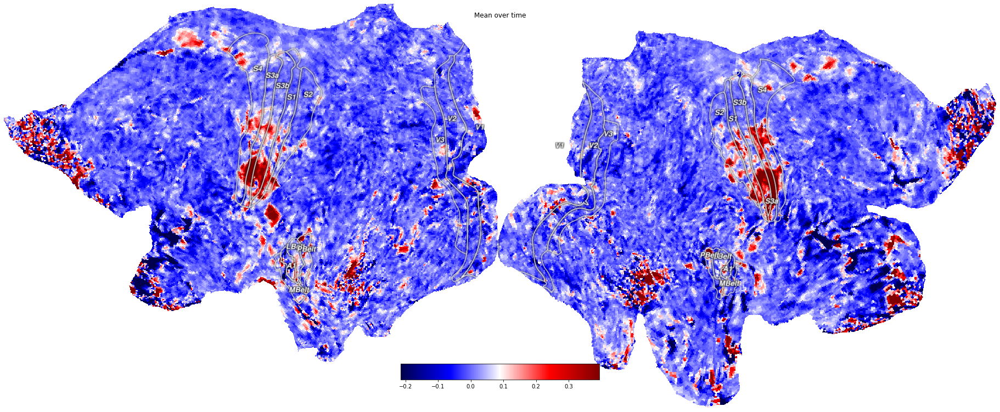

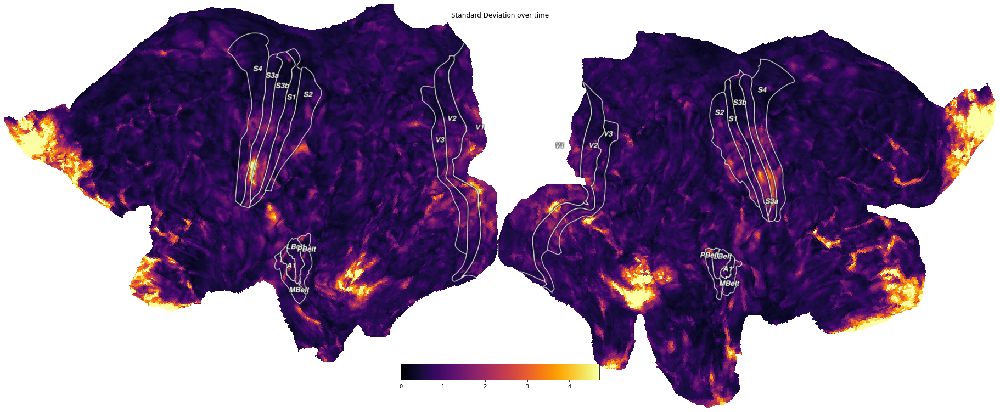

In [ ]:
# Note that we saw in the cell above that the second dimension is time, 
# so the axis on which we take the mean and standard deviation is 1
f = cx.quickshow(cx.Vertex(tseries_raw.mean(axis=1), subject='hcp_999999', cmap='seismic'));
f.suptitle('Mean over time')

f = cx.quickshow(cx.Vertex(tseries_raw.std(axis=1), subject='hcp_999999', cmap='inferno'));
f.suptitle('Standard Deviation over time');

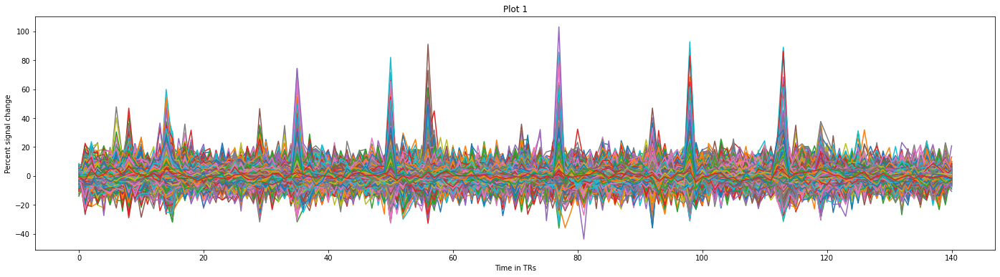

In [ ]:
# now, let's get some random time-courses to check whether there's still drift:
f = plt.figure(figsize=(24,6))
plt.plot(tseries_raw.T)
plt.xlabel('Time in TRs')
plt.ylabel('Percent signal change');
plt.title('Plot 1');

In [ ]:
# we read in the atlas data, which consists of 180 separate regions per hemisphere. 
# These are labeled separately, so the labels go to 360. 
# To work with them in both hemispheres simultaneously, we mod by 180. 
atlas_data = np.concatenate([load_surf_data(
        os.path.join('/content/data/atlas', f'Q1-Q6_RelatedParcellation210.CorticalAreas_dil_Colors.59k_fs_LR.dlabel.{hemi}.gii'))
         for hemi in ['L', 'R']])
atlas_data_both_hemis = np.mod(atlas_data, 180)

Failed to get connection
** (inkscape:4115): CRITICAL **: 22:40:04.859: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:4115): CRITICAL **: 22:40:04.859: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:4115): CRITICAL **: 22:40:04.860: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


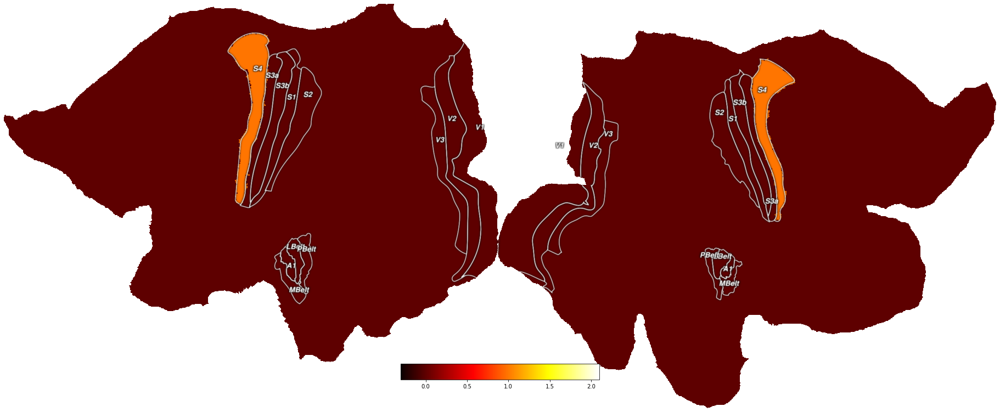

In [47]:
f = cx.quickshow(cx.Vertex(atlas_data_both_hemis == 8, subject='hcp_999999', cmap='hot', vmin=-0.3, vmax=2.1));

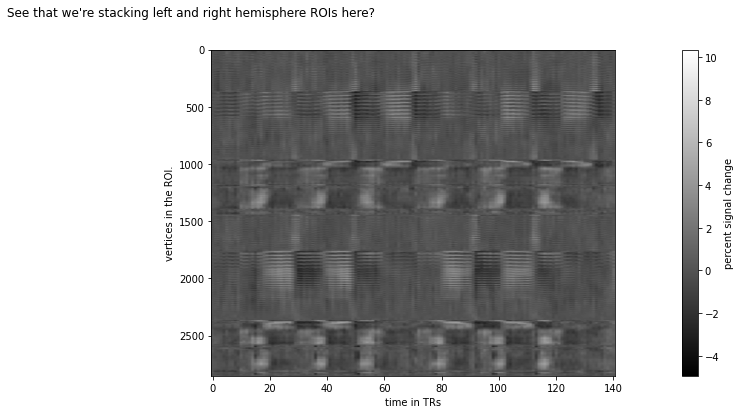

In [48]:
roi_boolean_mask = atlas_data_both_hemis == 8

# but let's look at the actual signals after percent signal change conversion. 
def psc(data):
  """take percent signal change of data along axis 1. 
  This implementation is a bit idiosyncratic since 
  it uses the median instead of the mean of the signal.
  For sparse signals with very strong activations (such as those at 7T)
  this approach makes sense. Can you imagine why?"""
  # crudely checking whether psc hasn't already happened, in which case do nothing
  if np.mean(data) < 0.5:
    return data
  return ((data.T/np.median(data, 1)).T - 1) * 100

f = plt.figure(figsize=(24,6))
plt.imshow(psc(tseries_raw[roi_boolean_mask]), aspect=1/25, cmap='gray')
plt.xlabel('time in TRs')
plt.ylabel('vertices in the ROI.')
plt.colorbar(label='percent signal change')
f.suptitle("See that we're stacking left and right hemisphere ROIs here?");

In [ ]:
roi_index_dict = {
    # somatosensory:
    'CS1_4': 8, 'CS2_3a': 53, 'CS3_3b': 9, 'CS4_1': 51, 'CS5_2': 52,
    # auditory:
    'A1': 24, 'PBelt': 124, 'MBelt': 173, 'LBelt': 174, '52': 103, 'RI': 104,
    # low-level visual:
    'V1': 1, 'V2': 4, 'V3': 5,
    # mid-level and high-level visual:
    'V3A': 13, 'V3B': 19, 'IPS1': 17, 'LIPv': 48, 'LIPd': 95, 
    'VIP': 49, 'FEF': 10, 'MST': 2, 'MT': 23, 'LO1': 20, 'LO2': 21, 'LO3': 159
    }

From these simple surface and time-course plots above, we can immediately gather a couple of things. Try to answer the following questions from both the flatmaps and the random time-courses.

    have these data been z-scored or percent signal changed? Check the colorbars! What would they look like if they'd been z-scored?
    have these data been high-pass filtered? Check the timecourses!
    where do you see the biggest signal fluctuations? What are the likely origins of these fluctuations?

You can use these insights in writing the data description section of your report! Note that there are differences between the different project-datasets, so make sure you inspect your own!

# 

In [ ]:
import pandas as pd
expt_df = pd.read_csv('/content/data/soma_mapper_59k/sub-01_ses-01_task-soma_run-median_events.tsv', sep='\t')
a = expt_df['trial_type'].drop_duplicates()
print(a)

expt_df.head(20)

0        eyebrows
1            eyes
2           mouth
3          tongue
4     lhand_fing1
5     lhand_fing2
6     lhand_fing3
7     lhand_fing4
8     lhand_fing5
9            lleg
15    rhand_fing1
17    rhand_fing2
19    rhand_fing3
21    rhand_fing4
23    rhand_fing5
25           rleg
Name: trial_type, dtype: object


,Unnamed: 0,onset,duration,trial_type
0,0,11.988714,2.250143,eyebrows
1,1,15.335506,2.251704,eyes
2,2,18.689733,2.250188,mouth
3,3,22.034835,2.250071,tongue
4,4,25.376571,2.254236,lhand_fing1
5,5,28.709952,2.255005,lhand_fing2
6,6,32.043396,2.250697,lhand_fing3
7,7,35.385158,2.250085,lhand_fing4
8,8,38.718646,2.250125,lhand_fing5
9,9,42.047893,2.251309,lleg


In [ ]:
# what types of stimuli were shown, and what bodyparts were actually moved?
# unique_event_types = np.unique(expt_df['trial_type'])
# print(unique_event_types)

# let's order these in a sensible way so that when we decide to loop over them, 
# it's easy to keep in mind what we're doing
unique_event_types = ['eyebrows', 'eyes', 'mouth', 'tongue', 'lhand_fing1', 'lhand_fing2', 'lhand_fing3', 'lhand_fing4', 'lhand_fing5', 'lleg',  'rhand_fing1', 'rhand_fing2', 'rhand_fing3',
 'rhand_fing4', 'rhand_fing5', 'rleg']

# so, we can use the pandas DataFrame 
# to easily take the event times for an example event type
# you can use this simple syntax yourself lateron
event_times = np.array(expt_df[expt_df['trial_type'] == 'rhand_fing2']['onset'])

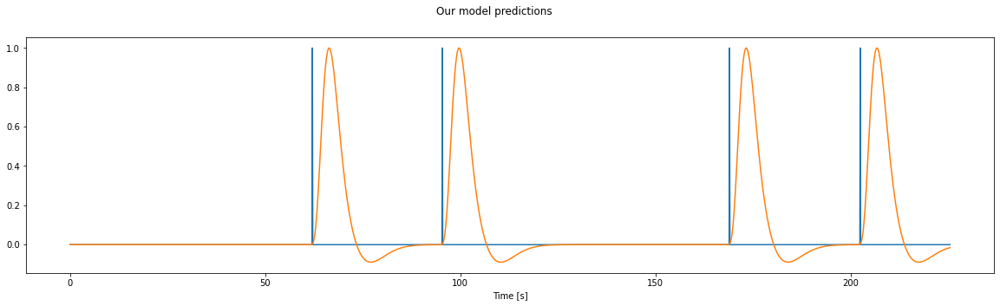

In [ ]:
# okay, now that we have event times, we'll be able to create a fine-timing timecourse. 
# I will tell you a secret: the TR in this experiment was 1.6s - you can find this info
# in the figshare website also. 
tr = 1.6

# create 0.1 s timescale regressor, and fill in the events
upscaled_times = np.arange(0, tseries_raw.shape[1]*tr, 0.1)
neural_event_timecourse = np.zeros(int(tseries_raw.shape[1]*tr*10))
# we'll pretend the events were instantaneous, since this will not
# impact the expected response shapes much
neural_event_timecourse[np.round(event_times * 10).astype(int)] = 1 


from nilearn.glm.first_level.hemodynamic_models import _gamma_difference_hrf

hrf = _gamma_difference_hrf(tr=tr ,oversampling=16, onset=-tr/2)
hrf /= hrf.max() # <- normalize HRF

bold_event_timecourse = np.convolve(neural_event_timecourse, hrf, 'full')[:neural_event_timecourse.shape[0]]

f = plt.figure(figsize=(20,5))
plt.plot(upscaled_times, neural_event_timecourse, label='neural')
plt.plot(upscaled_times, bold_event_timecourse, label='BOLD')
plt.suptitle('Our model predictions')
plt.xlabel('Time [s]');

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  after removing the cwd from sys.path.


Failed to get connection
** (inkscape:3644): CRITICAL **: 21:04:52.997: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3644): CRITICAL **: 21:04:52.998: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3644): CRITICAL **: 21:04:52.998: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
Failed to get connection
** (inkscape:3647): CRITICAL **: 21:04:54.537: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3647): CRITICAL **: 21:04:54.537: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3647): CRITICAL **: 21:04:54.537: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


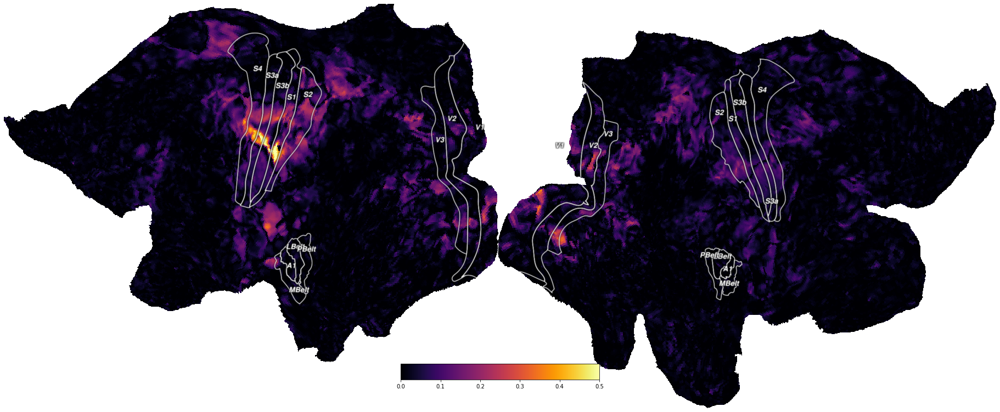

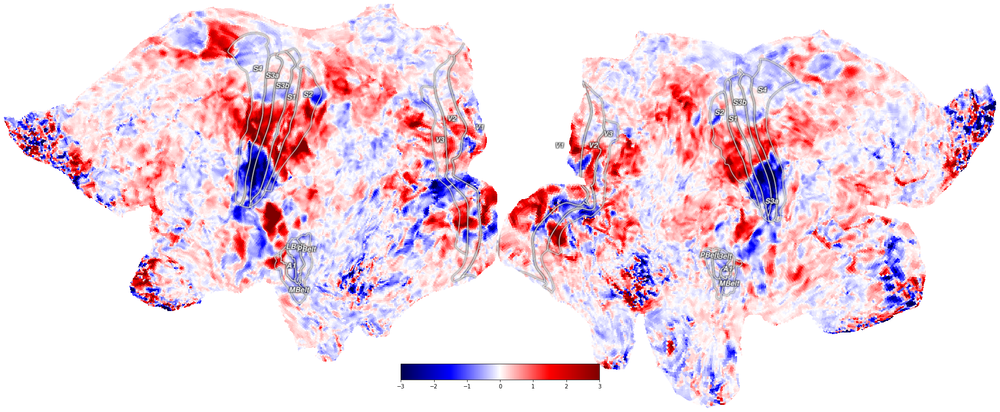

In [ ]:
sub_sampled_regressor = bold_event_timecourse[::16]
dm = np.vstack([np.ones_like(sub_sampled_regressor), sub_sampled_regressor]).T

betas, _, _, _ = np.linalg.lstsq(dm, tseries_raw.T)
# let's look at betas[1], since those are our tongue betas 

yhat = np.dot(betas.T, dm.T)
rsq = 1-(yhat-tseries_raw).var(1)/tseries_raw.var(1)

# we can visualize the rsq and beta weights separately
f1 = cx.quickshow(cx.Vertex(rsq, subject='hcp_999999', cmap='inferno', vmin=0, vmax=0.5));

masked_betas = betas[1]
# masked_betas[rsq < 0.3] = np.nan

f2 = cx.quickshow(cx.Vertex(masked_betas, subject='hcp_999999', cmap='seismic', vmin=-3, vmax=3, alpha=rsq));

# or use one to mask the other using a 2D Vertex object, and plotting that. 
# there seems to be a rendering issue, but we'll leave it at this.
# f12 = cx.quickshow(cx.Vertex2D(rsq, betas[1], subject='hcp_999999', cmap='BuWtRd_alpha', vmin=0.1, vmax=1, vmin2=-3, vmax2=3));

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.


Failed to get connection
** (inkscape:3651): CRITICAL **: 21:05:04.379: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3651): CRITICAL **: 21:05:04.380: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3651): CRITICAL **: 21:05:04.380: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


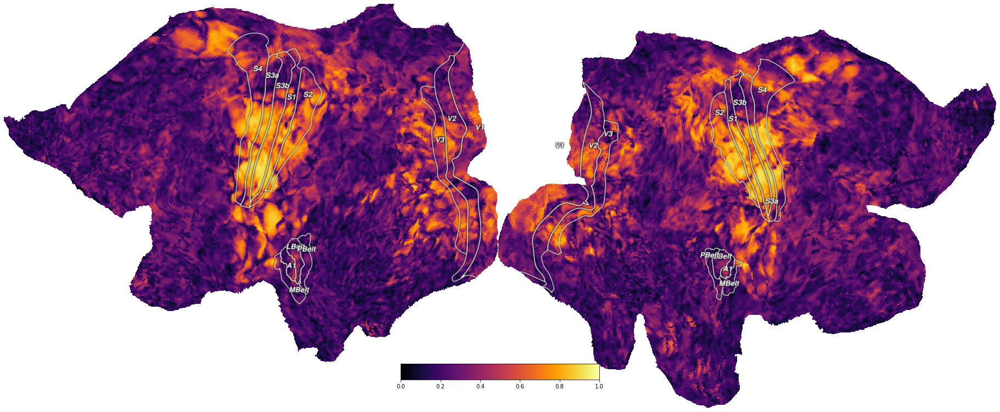

In [ ]:
def create_BOLD_regressor(event_times, n_timepoints, tr=1.6, supersampleratio=10):

    # create 0.1 s timescale regressor, and fill in the events
    upscaled_times = np.arange(0, n_timepoints*tr, 1/supersampleratio)
    neural_event_timecourse = np.zeros(int(n_timepoints*tr*supersampleratio))
    # we'll pretend the events were instantaneous, since this will not
    # impact the expected response shapes much. For events with variable durations
    # you'll want to make sure this doesn't happen :-)
    neural_event_timecourse[np.round(event_times * supersampleratio).astype(int)] = 1 

    hrf = _gamma_difference_hrf(tr=tr ,oversampling=tr*supersampleratio, onset=-tr/2)
    hrf /= hrf.max() # <- normalize HRF

    bold_event_timecourse = np.convolve(neural_event_timecourse, hrf, 'full')[:neural_event_timecourse.shape[0]]
    sub_sampled_regressor = bold_event_timecourse[::int(tr*supersampleratio)]
    return sub_sampled_regressor

def create_design_matrix(regressor_types, expt_df, data):
    regressors = [np.ones(data.shape[1])]
    for regressor_type in regressor_types:
        event_times = np.array(expt_df[expt_df['trial_type'] == regressor_type]['onset'])
        regressors.append(create_BOLD_regressor(event_times, data.shape[1]))
    return np.array(regressors)

dm = create_design_matrix(regressor_types=unique_event_types, expt_df=expt_df, data=tseries_raw)

betas, _, _, _ = np.linalg.lstsq(dm.T, tseries_raw.T)
yhat = np.dot(betas.T, dm)

rsq = 1-(yhat-tseries_raw).var(1)/tseries_raw.var(1)

f1 = cx.quickshow(cx.Vertex(rsq, subject='hcp_999999', cmap='inferno', vmin=0, vmax=1));

In [ ]:
def gauss1D_cart(x, mu=0.0, sigma=1.0):
    """gauss1D_cart

    gauss1D_cart takes a 1D array x, a mean and standard deviation,
    and produces a gaussian with given parameters, with a peak of height 1.

    Parameters
    ----------
    x : numpy.ndarray (1D)
        space on which to calculate the gauss
    mu : float, optional
        mean/mode of gaussian (the default is 0.0)
    sigma : float, optional
        standard deviation of gaussian (the default is 1.0)

    Returns
    -------
    numpy.ndarray
        gaussian values at x
    """

    return np.exp(-((x-mu)**2)/(2*sigma**2))

# **1.** T-statistic contrast left and right hand

Show the T-statistic of the contrast of "right hand" vs "left hand" to signify contralaterality of the hand representations. This should give you a broad idea of where the hand representation is in our S-named regions of interest (the ones that are green in the HCP flatmap explanation above). Use your knowledge from the glm practical to calculate these statistics, and use a t-statistic threshold of 4 in your visualizations. Do the same for the left foot vs the right foot. 

Failed to get connection
** (inkscape:3399): CRITICAL **: 20:42:59.982: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3399): CRITICAL **: 20:42:59.982: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3399): CRITICAL **: 20:42:59.982: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


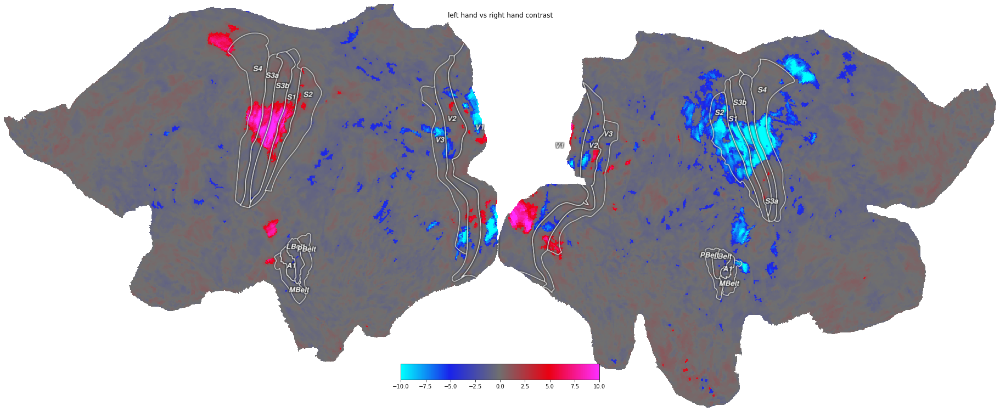

In [ ]:
# This function calculates the t-statistic based on 2 inputs, used for comparing left and right

def t_statistic(left, right):
  r = np.array([1 if right in uet else 0 for uet in unique_event_types])
  l = np.array([-1 if left in uet else 0 for uet in unique_event_types])
  contrast_vector = np.r_[0, r+l] # the intercept regressor was never in the event types list

  c_betas = np.dot(contrast_vector, betas)

  N = tseries_raw.shape[1]
  P = betas.shape[0]
  df = (N - P)

  sigma_hat = np.sum((tseries_raw - yhat) ** 2, axis=1) / df
  des_var = contrast_vector.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector.T)

  t = c_betas / np.sqrt(sigma_hat * des_var)
  t[np.abs(t) < 4] = t[np.abs(t) < 4]/4

  return(t)

# This function generates a flatmap of the contrast  

def plot_t_statistic(t, left, right):
  f2 = cx.quickshow(cx.Vertex(t, subject='hcp_999999', cmap='CyanBlueGrayRedPink', vmin=-10, vmax=10));
  f2.suptitle('left ' + left + ' vs right '+ right + ' contrast');


# Here we calculate the statistics for the left and right hand and create a flatmap of the results
t = t_statistic('lhand', 'rhand')
plot_t_statistic(t, 'hand', 'hand')

This code was mostly written in the backbone_project. The image above shows the contrast of 'left hand' and 'right hand'.

Failed to get connection
** (inkscape:3218): CRITICAL **: 14:21:55.871: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3218): CRITICAL **: 14:21:55.871: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3218): CRITICAL **: 14:21:55.871: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


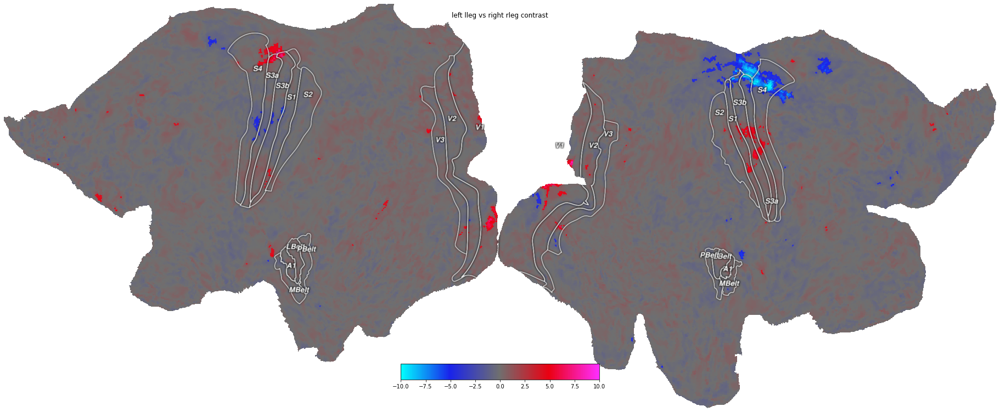

In [ ]:
# Here we calculate the statistics for the left and right foot and create a flatmap of the results
t = t_statistic('lleg', 'rleg')
plot_t_statistic(t,'leg', 'leg')

The above image shows the contrast between the 'left foot' and 'right foot'. 

# **2.** T-statistic contrast face and implicit base-line

Then, contrast the face vs an implicit baseline (an unbalanced contrast)

    Is the very coarse map of faces, hands, and feet we're seeing until now contiguous on the surface? Or are there some holes? If not, why do you think this is the case? Can you tie this back to the different regressors we have in our design?


In [ ]:
# This function calculates the t-statistic based on the input of a contrast vector, used for comparing to an implicit baseline

def t_statistic2(v1, v2=betas):
  
  c_betas = np.dot(v1, v2)

  N = tseries_raw.shape[1]
  P = betas.shape[0]
  df = (N - P)

  sigma_hat = np.sum((tseries_raw - yhat) ** 2, axis=1) / df
  
  des_var = contrast_vector.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector.T)

  t = c_betas / np.sqrt(sigma_hat * des_var)
  t[np.abs(t) < 4] = t[np.abs(t) < 4]/4

  # Here we plot the flatmap
  f2 = cx.quickshow(cx.Vertex(t, subject='hcp_999999', cmap='CyanBlueGrayRedPink', vmin=-10, vmax=10)); 
  f2.suptitle('Face (eyebrows, eyes, mouth, tongue) vs baseline contrast');

Failed to get connection
** (inkscape:3222): CRITICAL **: 14:22:00.263: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3222): CRITICAL **: 14:22:00.263: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3222): CRITICAL **: 14:22:00.263: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


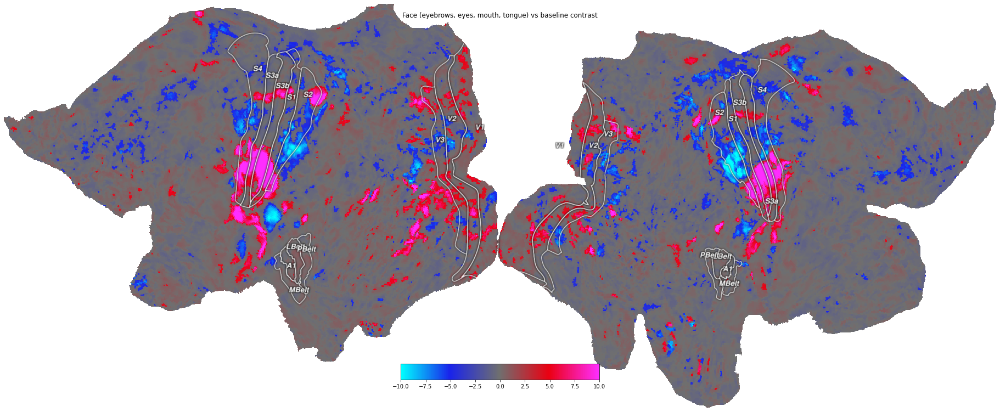

In [ ]:
var1 = np.array([1 if 'eyebrows' in uet else 0 for uet in unique_event_types])
var2 = np.array([1 if 'eyes' in uet else 0 for uet in unique_event_types])
var3 = np.array([1 if 'mouth' in uet else 0 for uet in unique_event_types])
var4 = np.array([1 if 'tongue' in uet else 0 for uet in unique_event_types])

contrast_vector = np.r_[0, var1+ var2+ var3+ var4] 
zeros=np.zeros(len(contrast_vector))

t_statistic2(contrast_vector)

The above image shows the contrast between the 'face' and the implicit baseline of zero activation. 

# **3.** T-statistic fingers

Now, subdivide the hand into its fingers, and test the left vs right contrast for each finger. For this analysis, create 5 separate flatmaps. For now I have kept the t-statistics threshold still on 4, but we might want to change that for the fingers.

**Thumb**

Failed to get connection
** (inkscape:3226): CRITICAL **: 14:22:04.624: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3226): CRITICAL **: 14:22:04.624: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3226): CRITICAL **: 14:22:04.624: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


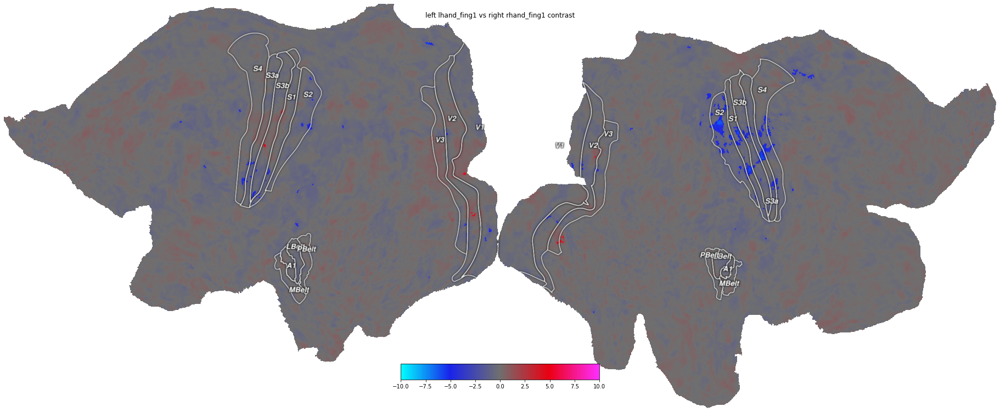

In [ ]:
t = t_statistic('lhand_fing1','rhand_fing1')
plot_t_statistic(t,'finger 1','finger 1')

**Pointer finger**

Failed to get connection
** (inkscape:3232): CRITICAL **: 14:22:08.930: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3232): CRITICAL **: 14:22:08.930: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3232): CRITICAL **: 14:22:08.930: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


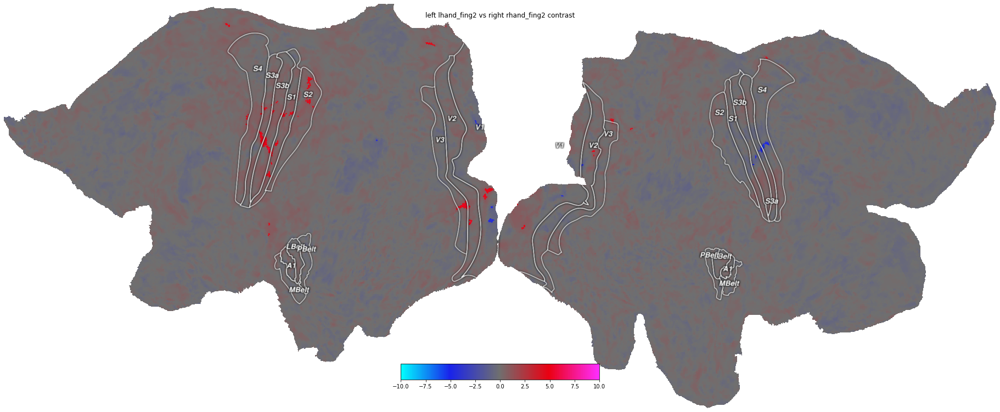

In [ ]:
t = t_statistic('lhand_fing2','rhand_fing2')
plot_t_statistic(t, 'finger 2','finger 2')

**Middle finger**

Failed to get connection
** (inkscape:3236): CRITICAL **: 14:22:13.383: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3236): CRITICAL **: 14:22:13.383: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3236): CRITICAL **: 14:22:13.383: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


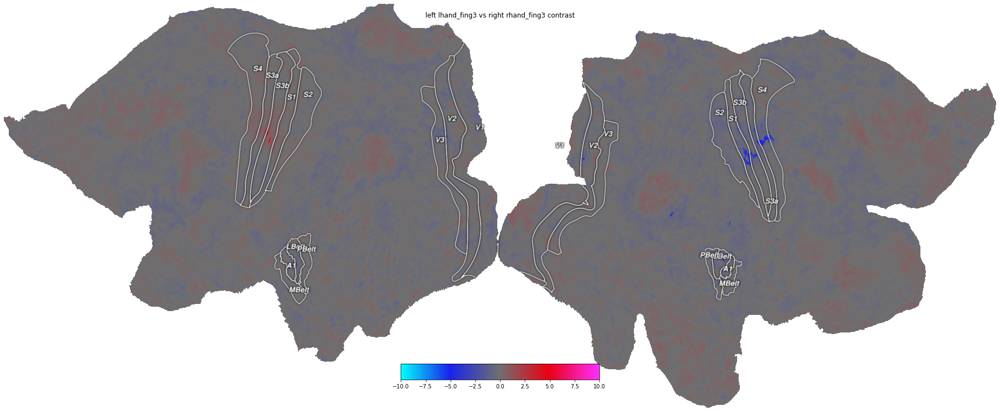

In [ ]:
t = t_statistic('lhand_fing3','rhand_fing3')
plot_t_statistic(t, 'finger 3','finger 3')

**Ring finger**

Failed to get connection
** (inkscape:3242): CRITICAL **: 14:22:17.847: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3242): CRITICAL **: 14:22:17.848: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3242): CRITICAL **: 14:22:17.848: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


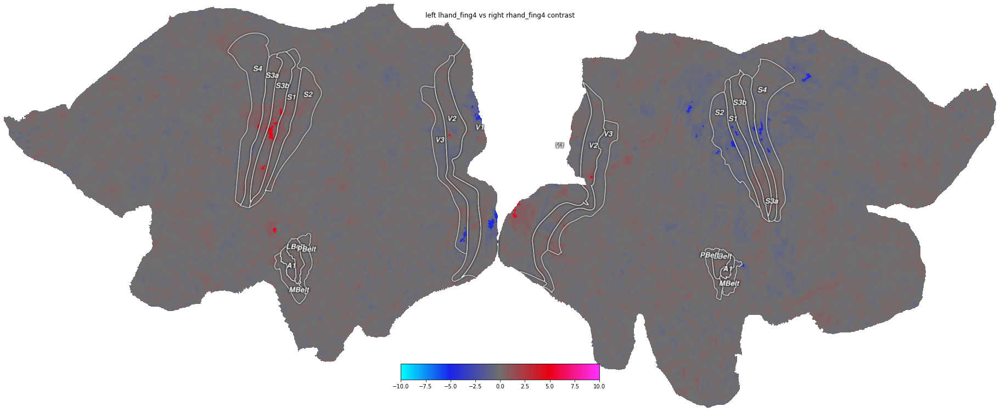

In [ ]:
t = t_statistic('lhand_fing4','rhand_fing4')
plot_t_statistic(t, 'finger 4','finger 4')

**Pinky**

Failed to get connection
** (inkscape:3246): CRITICAL **: 14:22:22.269: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3246): CRITICAL **: 14:22:22.269: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3246): CRITICAL **: 14:22:22.269: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


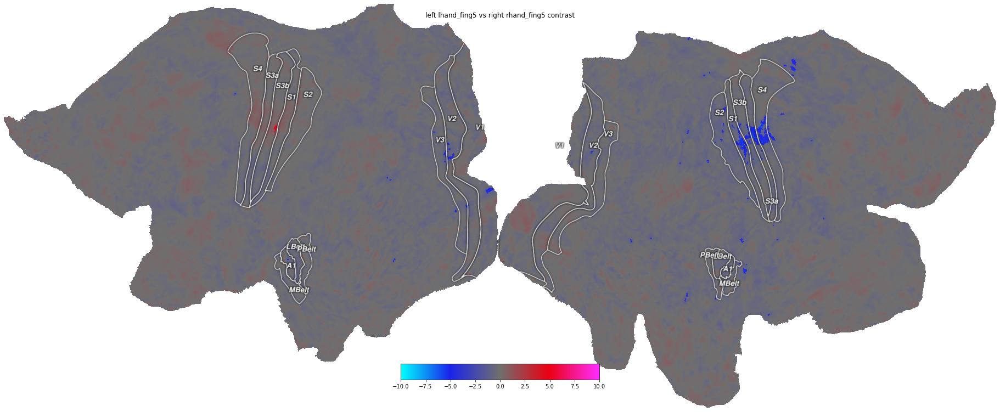

In [ ]:
t = t_statistic('lhand_fing5','rhand_fing5')
plot_t_statistic(t, 'finger 5','finger 5')

# **4.** Gradient representation of the fingers

But how are these ordered? Kind of hard to see now, with these separate figures. In the end, we want to create the actual somatotopic gradient on the surface! This is what we'll do.

    The first step is to figure out the winning finger for each voxel - use np.argmax for this.
    Now, re-code this such that you create a finger-line, running as follows: [-5, -4, -3, -2, -1, 1, 2, 3, 4, 5]. That is, from the left pinky to thumb and then from the right thumb to pinky. Set everything outside the hand regions you found in the previous analysis to 0 or np.nan. Now, visualize this using the CyanBlueGrayRedPink, nipy_spectral, or J4 colormaps to bring about the finger maps on the surface. Or, if you come up with your own coloring, by all means go ahead! Is this map monotonic? In your report, you should relate these qualities of the map to the literature we gave you, and literature that you've discovered yourself.
    In this experiment, subjects' movements would also have produced sensations. This means it's likely that you'll see these maps both in somatosensory AND motor cortex. In the Homunculus figure shown to the right here, there are slight differences between the two. Do your findings replicate this?


6.06967579085
Failed to get connection
** (inkscape:3859): CRITICAL **: 21:28:53.034: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3859): CRITICAL **: 21:28:53.034: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3859): CRITICAL **: 21:28:53.034: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


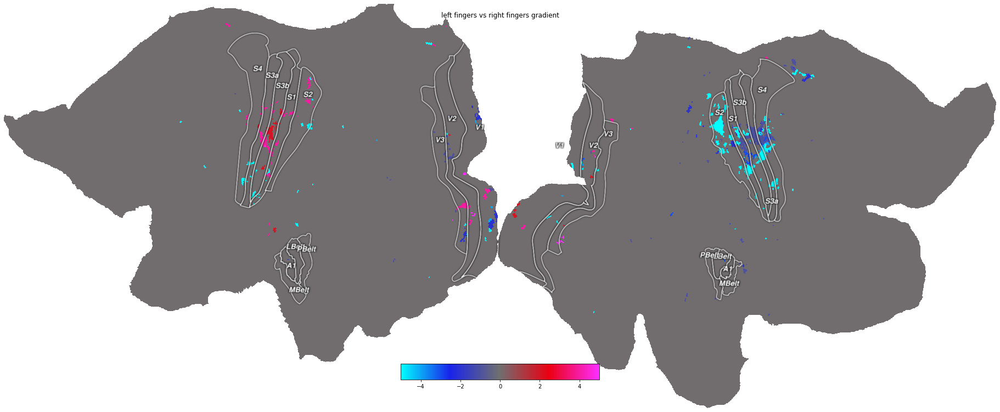

In [ ]:
# This function takes a list as argument of all the features we want to compare.
# It returns a list of the winning fingers from -5 to 5. 
# The first 5 numbers are of the left hand and the last 5 are from trhe right hand.
# The 0 is a neutral number not connected to any fingers

def winning_finger(flist):
  arr = [0 for i in range(5)]

  # Calculating all t-statistics for all fingers per voxel
  i = 0
  for x in flist:
    arr[i] = t_statistic(x[0],x[1])
    i = i +1 

  # Creating a 'winning' array of fingers based on the absolute highest t-statistic between the left and right fingers
  winning = np.zeros(len(arr[0]))
  for j in range(len(arr[0])):
    temp = np.zeros(len(arr)*2)
    # As we only get 1 t-statistic we have to make sure that it's value goes to the corresponding winning finger
    for i in range(len(arr)):
      if arr[i][j] < 0: # A negative t-statistic sets the absolute value to the left fingers and assigning the right finger a 0
        temp[i] = np.absolute(arr[i][j])
        temp[len(temp)-i-1] = 0
      else:
        temp[len(temp)-i-1] = np.absolute(arr[i][j])
        temp[i] = 0
    finger = 0
    if np.isnan(temp).any() or not np.any(temp): #If it was not shown in the previous images, set to 0 (or grey)
      finger = 0
    elif (all(i < 4 for i in temp)): # Here we could write a minimum value for the t-statistic shown in the flatmap
      finger = 0
    else:
      finger = np.argmax(temp) # Getting the winning finger based on index, minus 5 or 4 in order to get the correct numbers
      if finger < 5:
        finger = finger -5
      else:
        finger = finger -4


    winning[j] = finger
  return winning, arr


fingerlist = [('lhand_fing1','rhand_fing1'), ('lhand_fing2','rhand_fing2'), ('lhand_fing3','rhand_fing3'), ('lhand_fing4','rhand_fing4'), ('lhand_fing5','rhand_fing5')]
x, y = winning_finger(fingerlist)

print(max(max(i) for i in y)) #Highest t-statistic


# The plot only shows the activation of the winning finger. It is grey if there was no activation at all or if it was below our threshold.

def plot_fingermap(t, left, right):
  f2 = cx.quickshow(cx.Vertex(t, subject='hcp_999999', cmap='CyanBlueGrayRedPink', vmin=-5, vmax=5));
  f2.suptitle('left ' + left + ' vs right '+ right + ' gradient');

plot_fingermap(x, 'fingers', 'fingers')






The above image shows the winning fingers that had at least a t-statistic of 4. The legend goes from -5 to 5 with 0 being a neutral value in the flatmap. The finger-line follows the order: left pinky to thumb and right thumb to pinky.  

# **5.** Gradient representation of the face
Lastly, what about the face? Create a similar gradient representation of the face, top to bottom. What part of the face is most strongly represented? Is the resulting map monotonic? Again, what have you found about this map in the literature?


9.510212062455711
Failed to get connection
** (inkscape:3871): CRITICAL **: 21:29:34.174: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3871): CRITICAL **: 21:29:34.174: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3871): CRITICAL **: 21:29:34.175: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


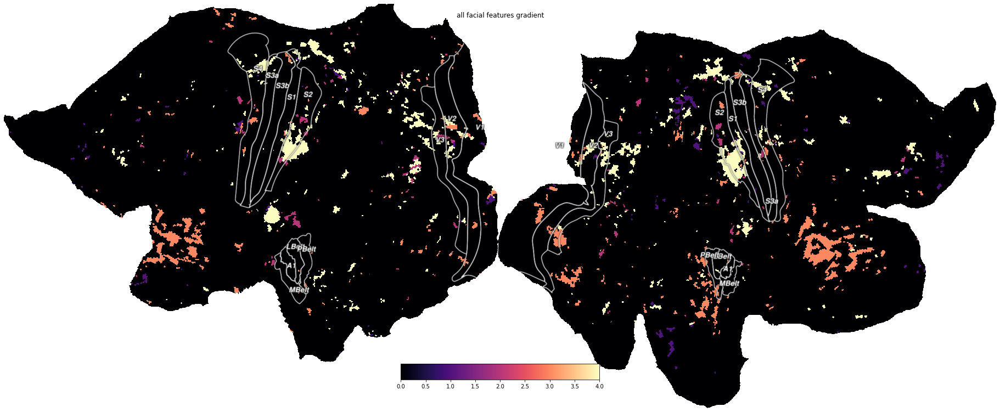

In [ ]:
def winning_facial_feature(flist):
  arr = [0 for i in range(4)]
  i = 0
  temp = 0
  for x in flist:
    arr[i] = t_statistic(x[0],x[1])
    i = i +1  
  winning = np.zeros(len(arr[0]))
  for j in range(len(arr[0])):
    temp = np.zeros(len(arr))
    for i in range(len(arr)):
        temp[i] = arr[i][j]
    face = 0
    if np.isnan(temp).any() or not np.any(temp): #If it was not shown in the previous images, set to 0 (or black)
      face = 0
    elif (all(i <= 4 for i in temp)): # Here we could write a minimum value for the t-statistic shown in the flatmap
      face = 0
    else:
      face = np.argmax(temp) # Getting the winning facial feature based on index, plus 1 5 in order to get the correct numbers
      face = face + 1
    winning[j] = face
  return winning, arr


facelist = [('eyebrows', 'x'), ('eyes', 'x'), ('mouth', 'x'), ('tongue', 'x')] # As 'x' is not included in the unique_event_types it defaults to a value of 0
# The facial gradient is therefore also compared based on the implicit baseline.
x, y = winning_facial_feature(facelist)


print(max(max(i) for i in y)) #Highest t-statistic

# The plot only shows the activation of the winning facial feature. It is black if there was no activation at all or if it was below our threshold.

def plot_fingermap(t):
  f2 = cx.quickshow(cx.Vertex(t, subject='hcp_999999', cmap='magma', vmin=0, vmax=4));
  f2.suptitle('all facial features gradient');

plot_fingermap(x)

## images:

spikes: 
![](https://drive.google.com/uc?export=view&id=1Zm-LsO_liqTdzaN9ycDOPcBL0bms-ukD)

hands: 
![](https://drive.google.com/uc?export=view&id=1eLF7BgT49dxHTPPkGh5dnSfHU_6uRtKZ)

feet:
![](https://drive.google.com/uc?export=view&id=1lDrZxREf02M-wQCprDiyCvZ0YbrQbNJk)

face:
![](https://drive.google.com/uc?export=view&id=1vfstam4VS90vBceay4VEneI1ZaNb8mnA)

gradient fingers:
![](https://drive.google.com/uc?export=view&id=1NTzBiYjUblSS1RvVVFeQ6xYmr3gBEf3l)

gradient face:
![](https://drive.google.com/uc?export=view&id=1bZ0qKvIF9oJ0hGacbvnVsoAmam0BIvLL)